<hr style="height:10px"> 
 
<div class='container2'>
	<h1>Trabalho Prático 02 - Inteligência Artificial</h1>
</div>

<hr style="height:5px"> 
  <h3>Thiago Corgosinho Silva - 20.2.8117</h3>
  <h3>Ruan Tiengo Rocha 19.2.8050</h3>
<hr style="height:2px"> 

In [680]:
import numpy as np 
import pandas as pd 
# Define as opções do pandas
pd.set_option('display.max_columns', None)

import seaborn as sns
import matplotlib.pyplot as plt

print('Bibliotecas carregadas com sucesso')

Bibliotecas carregadas com sucesso


Em seguida, os dados serão carregados do arquivo.

In [681]:
# importa o Dataframe do FIFA e guarda em um dataframe do Pandas

df_dataset = pd.read_csv( 'player_datasets_FIFA21.csv', encoding='ISO-8859-1') 

print('Dados importados com sucesso!')

Dados importados com sucesso!


C:\Users\thiag\AppData\Local\Temp\ipykernel_22292\2864222101.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_dataset = pd.read_csv( 'player_datasets_FIFA21.csv', encoding='ISO-8859-1')


Agora, vamos dar uma olhada nas 10 primeiras amostras da base de dados.

In [682]:
# Exibe o Dataframe
display(df_dataset.head(n=10))

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,F,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (AI), Speed Drib...",85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (AI), ...",84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,90.0,52.0,90.0,"GK Long Throw, Comes For Crosses",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,"#Distance Shooter, #Clinical Finisher",ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,"Solid Player, Finesse Shot, Outside Foot Shot,...",71,94,85,84,89,85,79,85,70,88,77,78,77,93,82,89,84,76,86,85,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnio

Aqui vamos eliminar diversar colunas que não representam as posições selecionadas e podem atrapalhar a treinar a IA.

In [683]:
colunas_usadas = ['team_position','pace','shooting','passing',
                  'defending', 'power_jumping', 'power_stamina', 
                  'physic', 'attacking_heading_accuracy',
                  'movement_agility' ,'movement_reactions' ,'movement_balance']



df_dataset = df_dataset.loc[:, colunas_usadas]

display(df_dataset.head(n=10))

,team_position,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
0,CAM,85.0,92.0,91.0,38.0,68,72,65.0,70,91,94,95
1,LS,89.0,93.0,81.0,35.0,95,84,77.0,90,87,95,71
2,GK,NaN,NaN,NaN,NaN,78,41,NaN,15,67,88,49
3,ST,78.0,91.0,78.0,43.0,84,76,82.0,85,77,93,82
4,LW,91.0,85.0,86.0,36.0,62,81,59.0,62,96,91,83
5,RCM,76.0,86.0,93.0,64.0,63,89,78.0,55,78,91,76
6,LS,96.0,86.0,78.0,39.0,77,86,76.0,73,92,92,82
7,GK,NaN,NaN,NaN,NaN,79,35,NaN,11,37,86,43
8,LCB,76.0,60.0,71.0,91.0,90,75,86.0,87,61,89,53
9,GK,NaN,NaN,NaN,NaN,52,32,NaN,19,40,88,37


## Pré-processamento: tratamento de atributos com valores ausentes

Outro passo importante, é verificar se existem atributos com valores ausentes (*NaN*) na base de dados.

In [684]:
# índices das linhas que contém valores NaN
idxRowNan = pd.isnull(df_dataset).any(1).to_numpy().nonzero()

# imprime apenas as linhas com valoes ausentes
display(df_dataset.iloc[idxRowNan])

C:\Users\thiag\AppData\Local\Temp\ipykernel_22292\1460413307.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  idxRowNan = pd.isnull(df_dataset).any(1).to_numpy().nonzero()


,team_position,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
2,GK,NaN,NaN,NaN,NaN,78,41,NaN,15,67,88,49
7,GK,NaN,NaN,NaN,NaN,79,35,NaN,11,37,86,43
9,GK,NaN,NaN,NaN,NaN,52,32,NaN,19,40,88,37
12,GK,NaN,NaN,NaN,NaN,68,38,NaN,13,61,84,45
16,GK,NaN,NaN,NaN,NaN,77,43,NaN,25,51,86,35
...,...,...,...,...,...,...,...,...,...,...,...,...
18892,RES,NaN,NaN,NaN,NaN,50,40,NaN,14,40,37,49
18908,RES,NaN,NaN,NaN,NaN,61,18,NaN,12,35,42,48
18913,SUB,NaN,NaN,NaN,NaN,64,20,NaN,14,23,44,47
18924,SUB,NaN,NaN,NaN,NaN,59,33,NaN,11,55,51,54


In [685]:
def trataFaltantes( df_dataset ):
    '''
    Substitui os valores faltantes pela média dos outros valores do mesmo atributo
    de amostras que sejam da mesma classe    
    '''
    
    df_dataset.fillna(0, inplace=True)
    
    return df_dataset
  


trataFaltantes( df_dataset )

    
# imprime apenas as linhas que antes possuiam valores NaN
print('\nAmostras que possuiam valores faltantes:')
display(df_dataset)


Amostras que possuiam valores faltantes:


,team_position,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
0,CAM,85.0,92.0,91.0,38.0,68,72,65.0,70,91,94,95
1,LS,89.0,93.0,81.0,35.0,95,84,77.0,90,87,95,71
2,GK,0.0,0.0,0.0,0.0,78,41,0.0,15,67,88,49
3,ST,78.0,91.0,78.0,43.0,84,76,82.0,85,77,93,82
4,LW,91.0,85.0,86.0,36.0,62,81,59.0,62,96,91,83
...,...,...,...,...,...,...,...,...,...,...,...,...
18939,SUB,63.0,37.0,50.0,41.0,57,40,50.0,43,53,51,71
18940,SUB,58.0,23.0,26.0,50.0,65,55,48.0,45,45,48,70
18941,RES,51.0,25.0,29.0,45.0,69,58,55.0,46,40,45,57
18942,RDM,61.0,35.0,48.0,44.0,56,48,58.0,45,59,51,53


## Pré-processamento: Exclusão de valores nulos, de goleiros e 0:
Verificamos se existem atributos com valores 0, RES, SUS e GOLEIROS na base de dados e excluimos na sequência.

In [686]:
def remover_posicoes_invalidas(df):
    # Cria uma lista com as posições inválidas
    posicoes_invalidas = ['RES', 'SUB', 'GK', 0]
    # Filtra as linhas que não possuem posições inválidas na coluna team_position
    df_valido = df[~df['team_position'].isin(posicoes_invalidas)]
    # Retorna o novo dataframe filtrado
    return df_valido
  
df_dataset = remover_posicoes_invalidas(df_dataset)
display(df_dataset)

,team_position,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
0,CAM,85.0,92.0,91.0,38.0,68,72,65.0,70,91,94,95
1,LS,89.0,93.0,81.0,35.0,95,84,77.0,90,87,95,71
3,ST,78.0,91.0,78.0,43.0,84,76,82.0,85,77,93,82
4,LW,91.0,85.0,86.0,36.0,62,81,59.0,62,96,91,83
5,RCM,76.0,86.0,93.0,64.0,63,89,78.0,55,78,91,76
...,...,...,...,...,...,...,...,...,...,...,...,...
18884,RS,64.0,52.0,41.0,23.0,38,36,34.0,38,54,38,84
18919,ST,70.0,48.0,37.0,22.0,60,59,47.0,47,57,43,57
18920,RCM,63.0,38.0,49.0,39.0,56,60,51.0,48,51,51,76
18933,RCM,62.0,22.0,39.0,45.0,66,60,55.0,40,57,47,52


## Pré-processamento: Substituição de posições

Diminuimos nossa base de dados de posições para 6, para melhor processamento e análise de dados.

In [687]:
def categorize_positions(dataset):
    positions = dataset['team_position'].unique()

    categories = {
      'Atacante': ['LS', 'ST', 'LW', 'RS', 'CF', 'RF', 'LF'],
      'Meia-atacante': ['CAM', 'LAM', 'RAM'],
      'Meia-central': ['RCM', 'LCM', 'CM'],
      'Meia-defensivo': ['CDM', 'RDM', 'LDM'],
      'Ala': ['RB', 'LB', 'RWB', 'LWB','RW','LM','RM'],
      'Zagueiro': ['LCB', 'RCB', 'CB']
    }

    for position in positions:
        for category, subcategories in categories.items():
            if position in subcategories:
                dataset.loc[dataset['team_position'] == position, 'team_position'] = category

    return dataset
categorize_positions( df_dataset )


display(df_dataset)

,team_position,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
0,Meia-atacante,85.0,92.0,91.0,38.0,68,72,65.0,70,91,94,95
1,Atacante,89.0,93.0,81.0,35.0,95,84,77.0,90,87,95,71
3,Atacante,78.0,91.0,78.0,43.0,84,76,82.0,85,77,93,82
4,Atacante,91.0,85.0,86.0,36.0,62,81,59.0,62,96,91,83
5,Meia-central,76.0,86.0,93.0,64.0,63,89,78.0,55,78,91,76
...,...,...,...,...,...,...,...,...,...,...,...,...
18884,Atacante,64.0,52.0,41.0,23.0,38,36,34.0,38,54,38,84
18919,Atacante,70.0,48.0,37.0,22.0,60,59,47.0,47,57,43,57
18920,Meia-central,63.0,38.0,49.0,39.0,56,60,51.0,48,51,51,76
18933,Meia-central,62.0,22.0,39.0,45.0,66,60,55.0,40,57,47,52


Após remover as amostras redundantes, é preciso checar se há amostras inconsistentes. 

In [688]:
duplicados = df_dataset[ df_dataset.duplicated(subset=colunas_usadas[1:],keep=False)] 

if len(duplicados) > 0:
    print('\nAmostras inconsistentes:')
    display(duplicados)
else:
    print('Não existem mostras inconsistentes')
    

Não existem mostras inconsistentes


Em seguida, eliminamos as amostras inconsistentes.

In [689]:
def delInconsistencias( df_dataset ):
    df_dataset = df_dataset.drop_duplicates(keep = False)    
    return df_dataset
  
df_dataset = delInconsistencias( df_dataset )

df_duplicates = df_dataset[ df_dataset.duplicated(subset=colunas_usadas[1:],keep=False)] 


if len(df_duplicates)>0:
    display(df_duplicates)
else:
    print('Não existem amostras redundantes ou inconsistentes')
    

Não existem amostras redundantes ou inconsistentes


# Estatísticas sobre a base de dados.

Média, desvio padrão, valor máximo, valor mínimo e alguns percentis.

In [690]:
# apresenta as principais estatísticas da base de dados
df_detalhes = df_dataset.describe()

display(df_detalhes)

,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
count,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000
mean,68.130396,54.466814,60.193392,55.386784,67.515272,70.934655,67.956535,59.245668,67.412628,65.351836,66.783994
std,11.880223,14.202183,9.758655,15.824142,11.842996,10.148160,8.538967,11.549519,12.400561,7.961493,12.354373
min,29.000000,17.000000,25.000000,17.000000,27.000000,28.000000,31.000000,20.000000,27.000000,38.000000,26.000000
25%,62.000000,44.000000,54.000000,42.000000,60.000000,65.000000,63.000000,51.000000,61.000000,60.000000,60.000000
50%,69.000000,57.000000,61.000000,61.000000,69.000000,71.000000,69.000000,60.000000,69.000000,65.000000,68.000000
75%,76.000000,65.000000,67.000000,67.000000,75.000000,77.000000,74.000000,68.000000,76.000000,70.000000,75.000000
max,96.000000,93.000000,93.000000,91.000000,95.000000,97.000000,91.000000,93.000000,96.000000,95.000000,95.000000


## Pré-processamento: normalização dos atributos

Normalizar os valores dos atributos para que fiquem com média igual a zero e desvio padrão igual a um.

In [691]:
def normalizar(X):
    m, n = X.shape # m = qtde de objetos e n = qtde de atributos por objeto
    # Incializa as variaves de saída
    X_norm = np.random.rand(m,n) # inicializa X_norm com valores aleatórios
    mu = 0 # inicializa a média
    sigma = 1 # inicializa o desvio padrão
     
    mu = np.mean(X, axis=0)
    sigma = np.std(X, axis=0, ddof=1)
    
    for i in range(m):
        X_norm[i,:] = (X[i,:]-mu) / sigma
    
    return X_norm, mu, sigma


X = df_dataset.iloc[:, 1:].values
# chama a função para normalizar X
X_norm, mu, sigma = normalizar(X)

df_dataset.iloc[:, 1:] = X_norm

print('\nPrimeira amostra da base antes da normalização: [%2.4f %2.4f].' %(X[0,0],X[0,1]))
print('\nApós a normalização, espera-se que a primeira amostra seja igual a: [1.4202 2.6419].')
print('\nPrimeira amostra da base apos normalização: [%2.4f %2.4f].' %(X_norm[0,0],X_norm[0,1]))



Primeira amostra da base antes da normalização: [85.0000 92.0000].

Após a normalização, espera-se que a primeira amostra seja igual a: [1.4202 2.6419].

Primeira amostra da base apos normalização: [1.4200 2.6428].


Agora que os dados estão normalizados, analisa-se as informações estatísticas novamente.

In [692]:
# apresenta as principais estatísticas da base de dados
df_detalhes = df_dataset.describe()

display(df_detalhes.round(8))

,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
count,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000,6810.000000
mean,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000
std,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
min,-3.293743,-2.638102,-3.606377,-2.425837,-3.421032,-4.230782,-4.327987,-3.398035,-3.258936,-3.435516,-3.301179
25%,-0.516017,-0.736986,-0.634656,-0.845972,-0.634575,-0.584801,-0.580461,-0.713940,-0.517124,-0.672215,-0.549117
50%,0.073198,0.178366,0.082656,0.354725,0.125368,0.006439,0.122200,0.065313,0.128008,-0.044192,0.098427
75%,0.662412,0.741660,0.697494,0.733892,0.631996,0.597679,0.707751,0.757982,0.692499,0.583831,0.665028
max,2.345882,2.713188,3.361796,2.250562,2.320758,2.568480,2.698625,2.922575,2.305329,3.723945,2.283888


Pode-se ver acima que a média (*mean*) ficou igual a 0 e o desvio padrão (*std*) igual a 1. 

## Pré-processamento: detecção de *outliers*

Detecção de *outliers* (*i.e.*, dados gerados por leituras incorretas, erros de digitação, etc). 


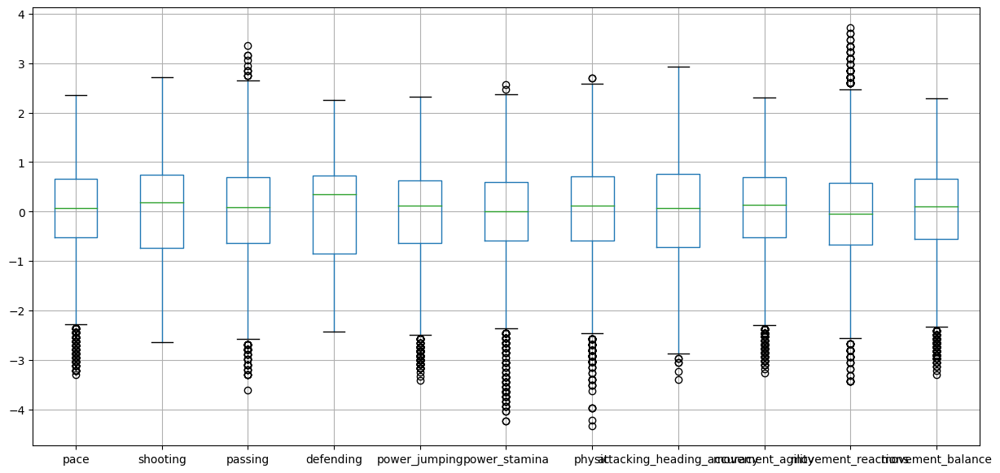

In [693]:
# gera um bloxplot para cada atributo
df_dataset.boxplot(figsize=(15,7))
plt.show()


Outra forma de analisar se a base de dados contém *outliers* é usar gráficos de dispersão. Abaixo temos os gráficos de dispersão de todas as combinações de atributos da base de dados usando a função scatter_matrix da Pandas.

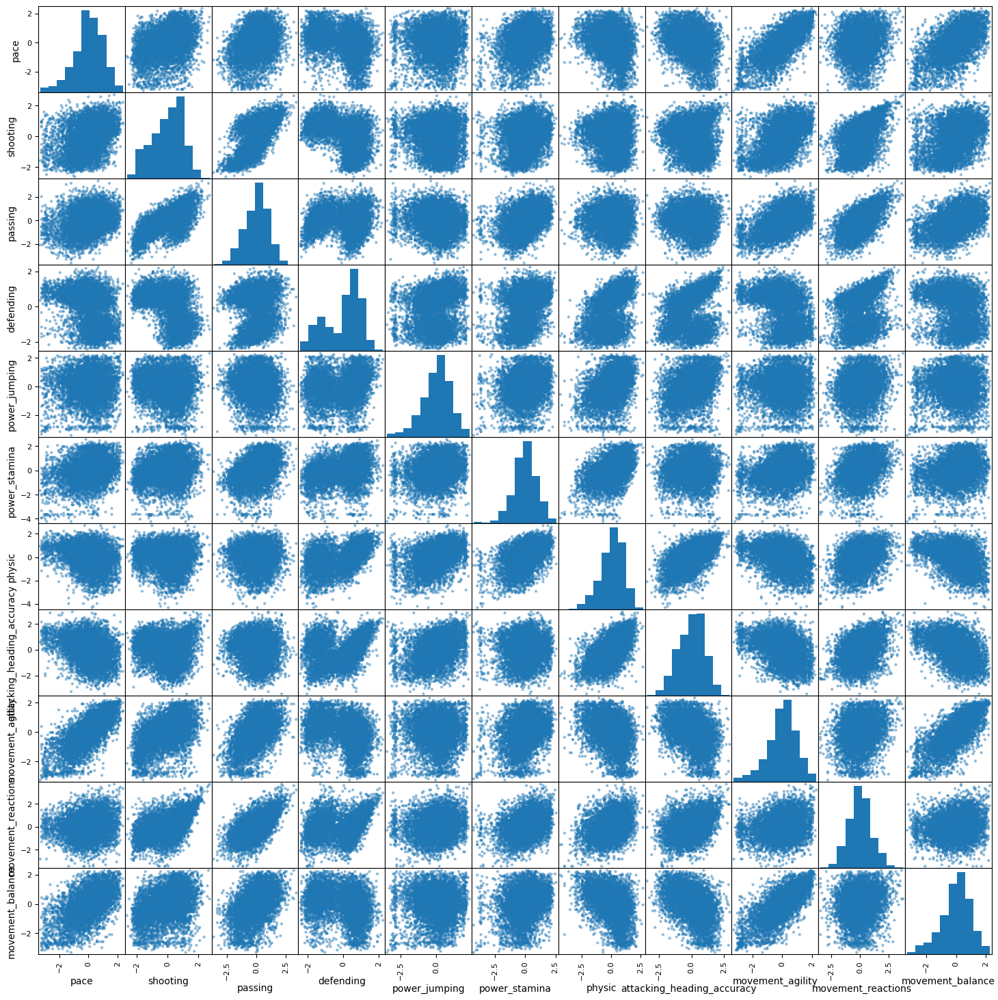

In [694]:
pd.plotting.scatter_matrix(df_dataset, figsize=(18,18))

plt.show()

Outra forma de plotar gráficos de dispersão a partir dos _dataframes_ é usando a biblioteca Seaborn. E personalizamos o gráfico com o Matplotlib

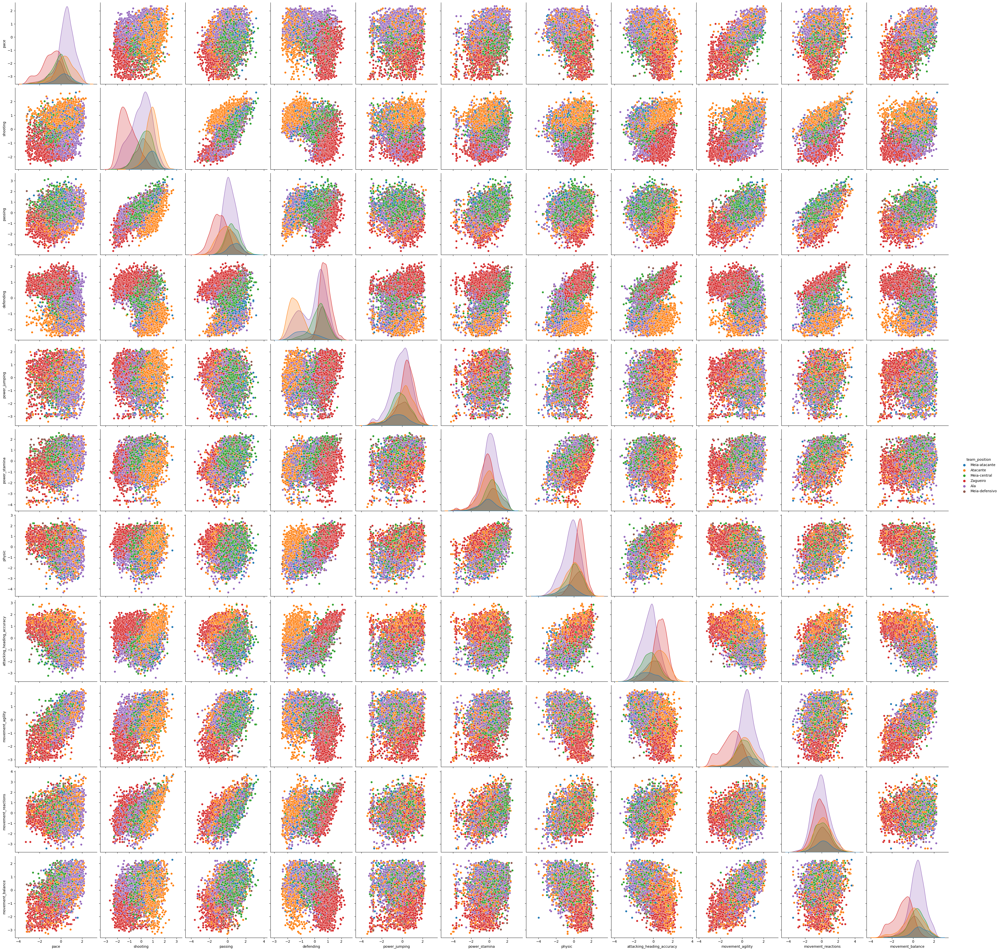

In [695]:
# matriz de gráficos scatter 
sns.pairplot(df_dataset, hue='team_position', height=3.5)

# mostra o gráfico usando a função show() da matplotlib
plt.show()

Combinação dos atributos `shooting` e `defending`:

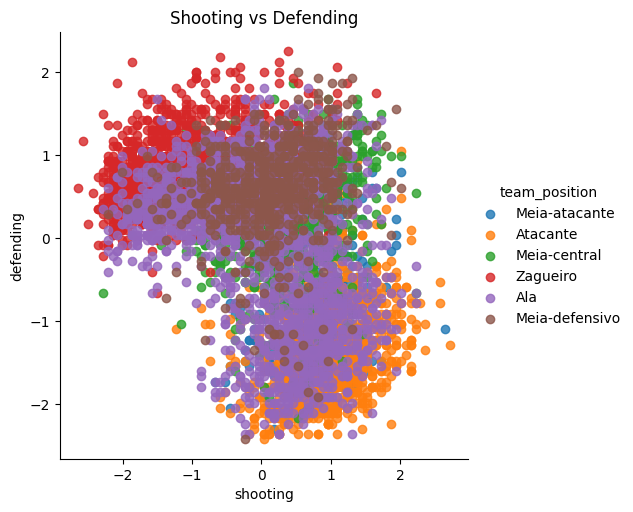

In [696]:
# define o scatter plot
sns.lmplot(x='shooting', y='defending', data=df_dataset, 
           fit_reg=False,  
           hue='team_position')

# cria um título para o gráfico
plt.title('Shooting vs Defending')

# mostra o gráfico
plt.show()

A seguir criaremos boxplots para cada atributo agrupados pela classe. Que facilita a análise dos dados:

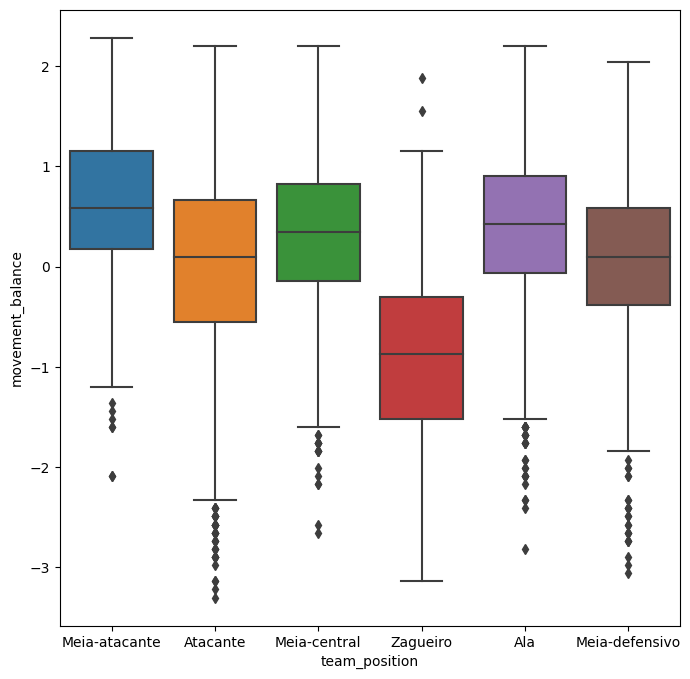

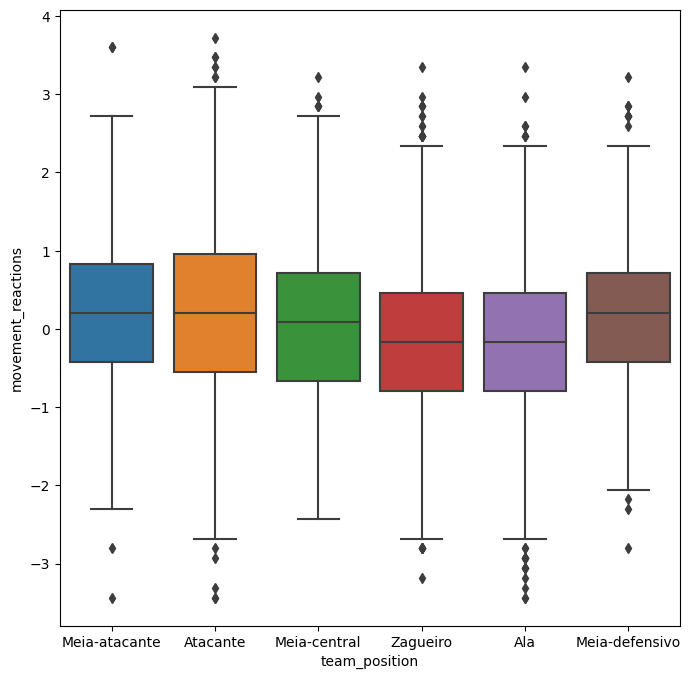

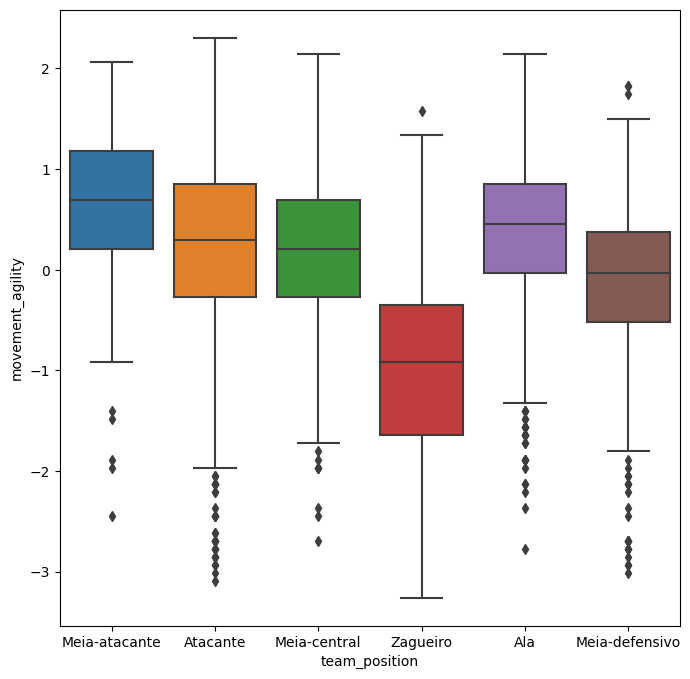

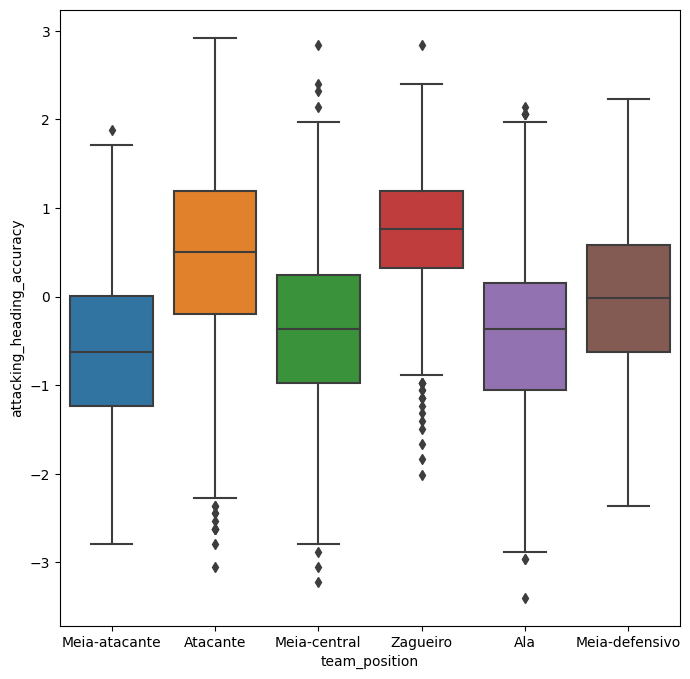

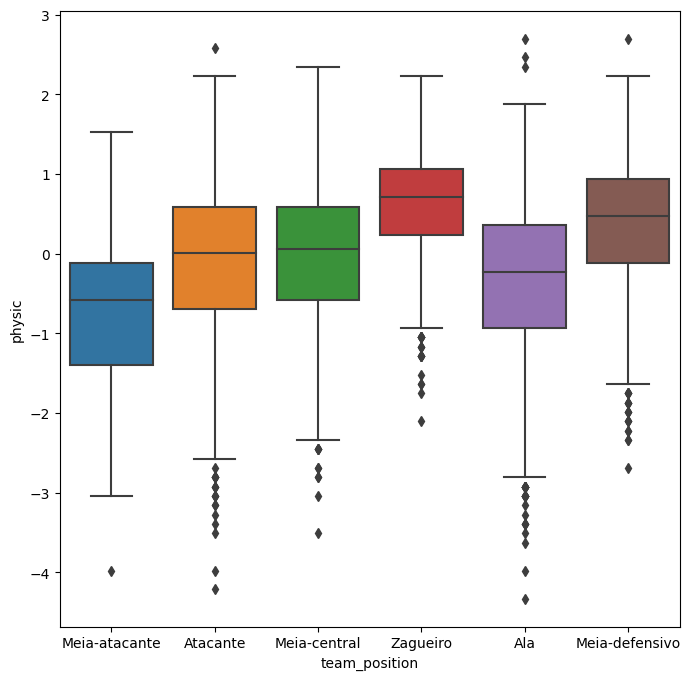

...

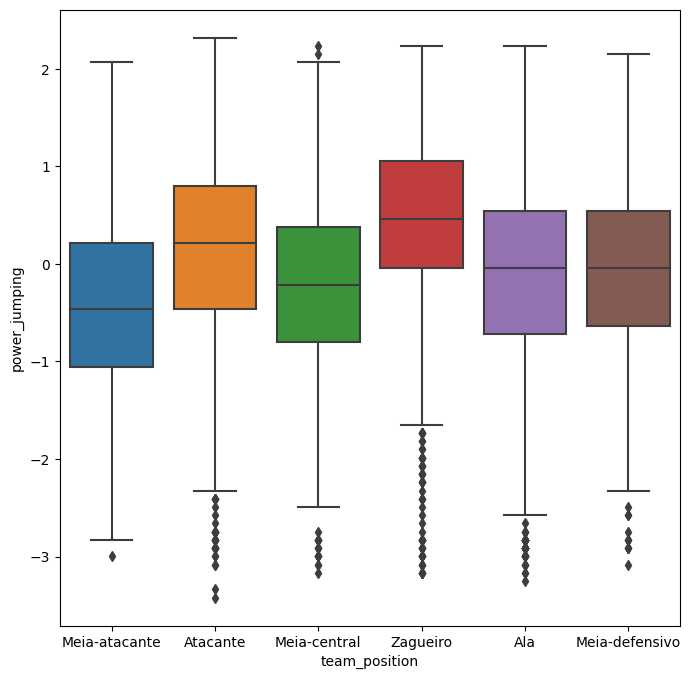

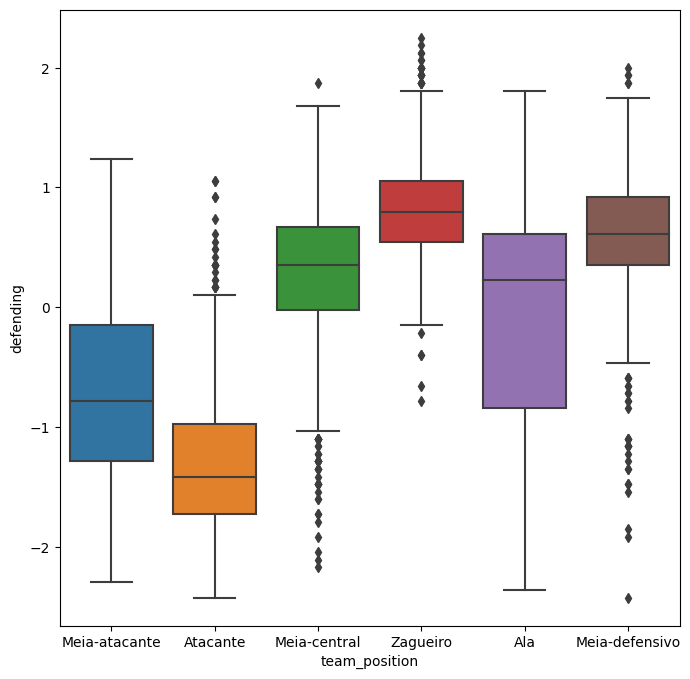

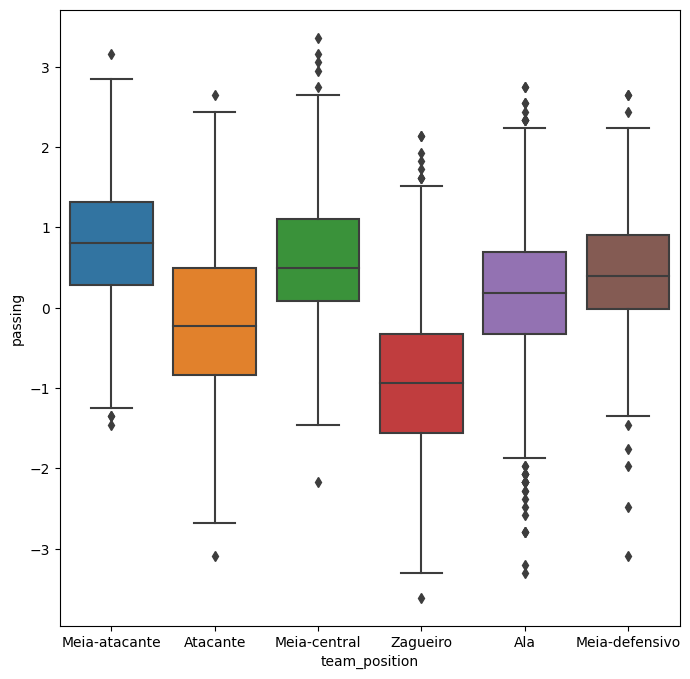

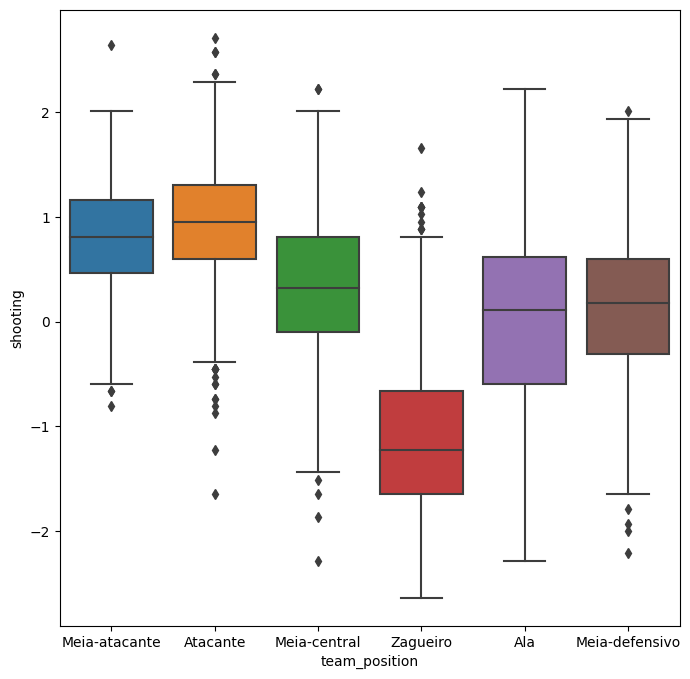

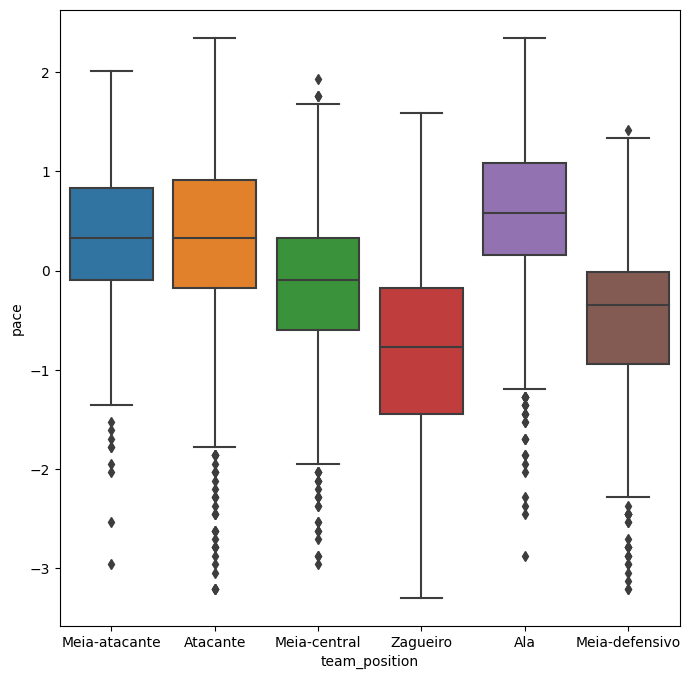

In [697]:

for atributo in df_dataset.columns[:0:-1]:
    # define a dimensão do gráfico
    plt.figure(figsize=(8,8))

    # cria o boxplot
    sns.boxplot(x="team_position", y=atributo, data=df_dataset, whis=1.5)

    # mostra o gráfico
    plt.show()

Histograma para analisar cada atributo:

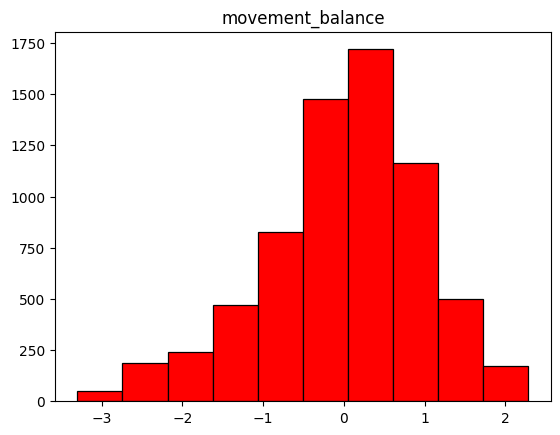

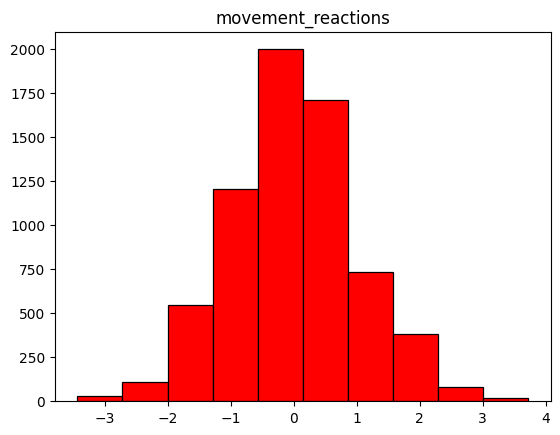

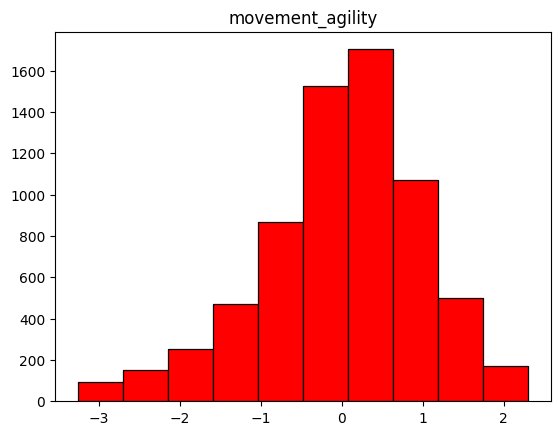

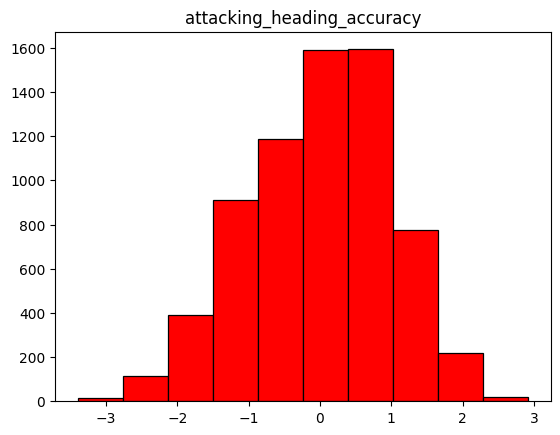

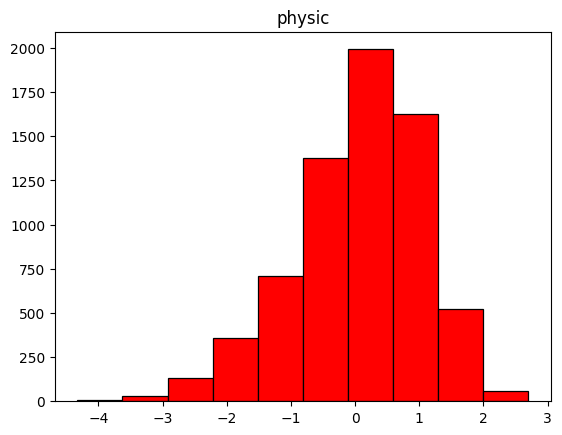

...

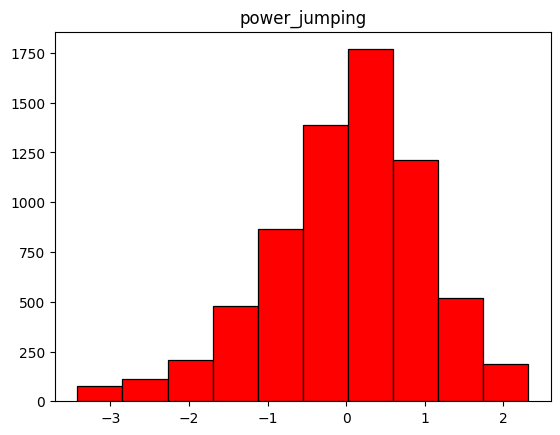

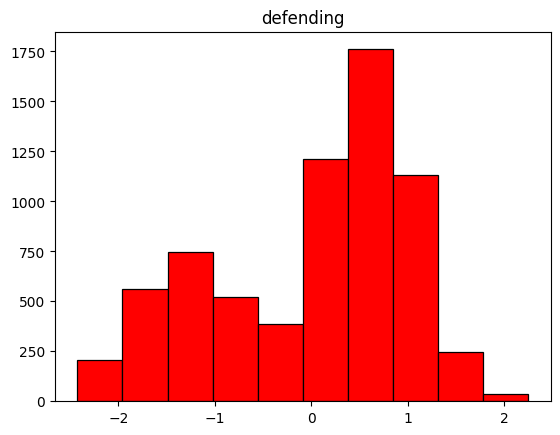

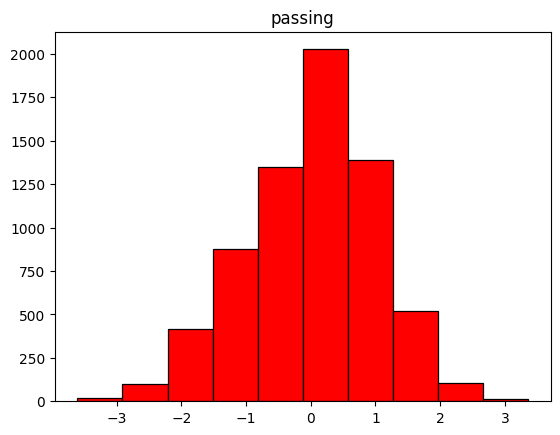

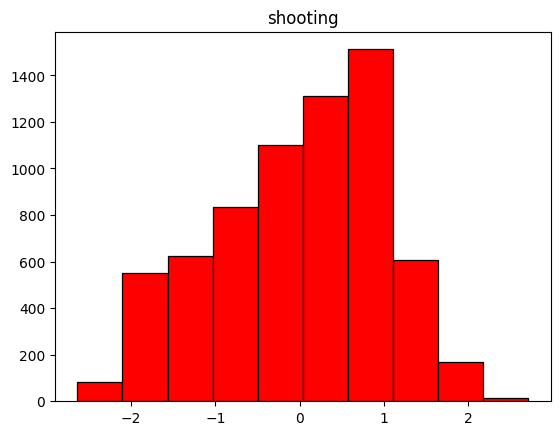

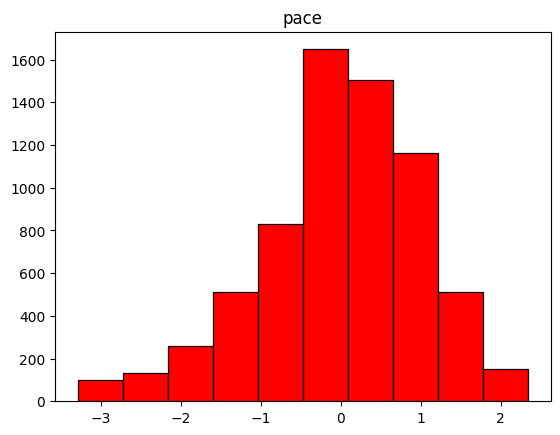

In [698]:
for atributo in df_dataset.columns[:0:-1]:
    
    # cria o histograma
    n, bins, patches = plt.hist(df_dataset[atributo].values,bins=10, color='red', edgecolor='black', linewidth=0.9)

    # cria um título para o gráfico
    plt.title(atributo)

    # mostra o gráfico
    plt.show()

## Pré-processamento: distribuição das classes

Outro passo importante na análise de dados é verificar a distribuição das classes. 
Gráfico de barra indicando quantas amostras de cada classe há na base de dados.

Ala               2272
Zagueiro          1490
Atacante          1109
Meia-central       926
Meia-defensivo     677
Meia-atacante      336
Name: team_position, dtype: int64

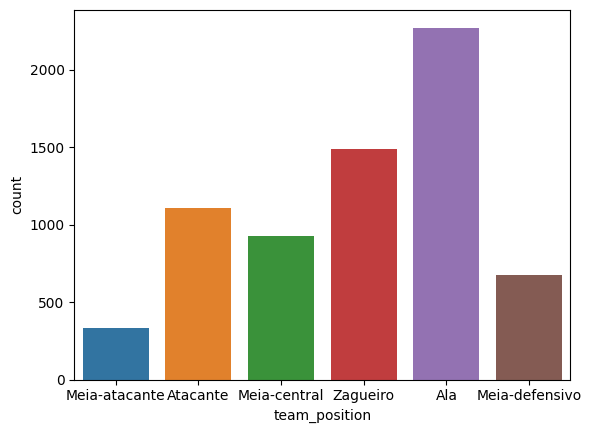

In [699]:
display( df_dataset['team_position'].value_counts() )

# cria um gráfico de barras com a frequência de cada team_position
sns.countplot(x="team_position", data=df_dataset)

# mostra o gráfico
plt.show()

## Pré-processamento: correlação entre os atributos

Verificando a correlação para avaliar se algum atributo deve ser eliminado.

In [700]:
# criando uma matriz X com os valores do data frame
X = df_dataset.iloc[:,1:].values

# matriz de covariancia
covariance = np.cov(X, rowvar=False)

# matriz de correlação
correlation = np.corrcoef(X, rowvar=False)

print('Matriz de covariância: ')
display(covariance)

print('\n\nMatriz de correlação: ')
display(correlation)

Matriz de covariância: 


array([[ 1.00000000e+00,  3.53555936e-01,  3.02112788e-01,
        -3.37578460e-01,  2.89229468e-02,  2.93095705e-01,
        -2.66670488e-01, -3.24185249e-01,  7.28384154e-01,
         1.09968736e-01,  5.74226510e-01],
       [ 3.53555936e-01,  1.00000000e+00,  6.78688513e-01,
        -4.63568531e-01, -7.47488321e-02,  1.89856773e-01,
        -8.55157172e-02, -2.37100070e-02,  5.02643179e-01,
         4.65310593e-01,  3.75841120e-01],
       [ 3.02112788e-01,  6.78688513e-01,  1.00000000e+00,
         5.97145869e-02, -8.08163211e-02,  3.73035343e-01,
         9.89174927e-04, -8.62212593e-02,  5.25318082e-01,
         6.21989437e-01,  4.54318733e-01],
       [-3.37578460e-01, -4.63568531e-01,  5.97145869e-02,
         1.00000000e+00,  2.10213847e-01,  2.76001423e-01,
         5.16573365e-01,  3.26833795e-01, -3.21753658e-01,
         2.27570387e-01, -2.32764927e-01],
       [ 2.89229468e-02, -7.47488321e-02, -8.08163211e-02,
         2.10213847e-01,  1.00000000e+00,  2.01724078e-01,
  



Matriz de correlação: 


array([[ 1.00000000e+00,  3.53555936e-01,  3.02112788e-01,
        -3.37578460e-01,  2.89229468e-02,  2.93095705e-01,
        -2.66670488e-01, -3.24185249e-01,  7.28384154e-01,
         1.09968736e-01,  5.74226510e-01],
       [ 3.53555936e-01,  1.00000000e+00,  6.78688513e-01,
        -4.63568531e-01, -7.47488321e-02,  1.89856773e-01,
        -8.55157172e-02, -2.37100070e-02,  5.02643179e-01,
         4.65310593e-01,  3.75841120e-01],
       [ 3.02112788e-01,  6.78688513e-01,  1.00000000e+00,
         5.97145869e-02, -8.08163211e-02,  3.73035343e-01,
         9.89174927e-04, -8.62212593e-02,  5.25318082e-01,
         6.21989437e-01,  4.54318733e-01],
       [-3.37578460e-01, -4.63568531e-01,  5.97145869e-02,
         1.00000000e+00,  2.10213847e-01,  2.76001423e-01,
         5.16573365e-01,  3.26833795e-01, -3.21753658e-01,
         2.27570387e-01, -2.32764927e-01],
       [ 2.89229468e-02, -7.47488321e-02, -8.08163211e-02,
         2.10213847e-01,  1.00000000e+00,  2.01724078e-01,
  

Agora, serão calculadas as matrizes de correlação e covariância usando a `Pandas`.

In [701]:
# matriz de covariancia
df_covariance = df_dataset.cov()

# matriz de correlação
df_correlation = df_dataset.corr()

print('Matriz de covariância: ')
display(df_covariance)

print('\n\nMatriz de correlação: ')
display(df_correlation)

Matriz de covariância: 


C:\Users\thiag\AppData\Local\Temp\ipykernel_22292\1580738002.py:2: FutureWarning: The default value of numeric_only in DataFrame.cov is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_covariance = df_dataset.cov()
C:\Users\thiag\AppData\Local\Temp\ipykernel_22292\1580738002.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_correlation = df_dataset.corr()


,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
pace,1.000000,0.353556,0.302113,-0.337578,0.028923,0.293096,-0.266670,-0.324185,0.728384,0.109969,0.574227
shooting,0.353556,1.000000,0.678689,-0.463569,-0.074749,0.189857,-0.085516,-0.023710,0.502643,0.465311,0.375841
passing,0.302113,0.678689,1.000000,0.059715,-0.080816,0.373035,0.000989,-0.086221,0.525318,0.621989,0.454319
defending,-0.337578,-0.463569,0.059715,1.000000,0.210214,0.276001,0.516573,0.326834,-0.321754,0.227570,-0.232765
power_jumping,0.028923,-0.074749,-0.080816,0.210214,1.000000,0.201724,0.427164,0.395283,0.005786,0.157971,-0.003431
power_stamina,0.293096,0.189857,0.373035,0.276001,0.201724,1.000000,0.464725,0.040199,0.294212,0.337041,0.233930
physic,-0.266670,-0.085516,0.000989,0.516573,0.427164,0.464725,1.000000,0.610117,-0.342738,0.337409,-0.410495
attacking_heading_accuracy,-0.324185,-0.023710,-0.086221,0.326834,0.395283,0.040199,0.610117,1.000000,-0.403363,0.364145,-0.462507
movement_agility,0.728384,0.502643,0.525318,-0.321754,0.005786,0.294212,-0.342738,-0.403363,1.000000,0.217897,0.746086
movement_reactions,0.109969,0.465311,0.621989,0.227570,0.157971,0.337041,0.337409,0.364145,0.217897,1.000000,0.134635




Matriz de correlação: 


,pace,shooting,passing,defending,power_jumping,power_stamina,physic,attacking_heading_accuracy,movement_agility,movement_reactions,movement_balance
pace,1.000000,0.353556,0.302113,-0.337578,0.028923,0.293096,-0.266670,-0.324185,0.728384,0.109969,0.574227
shooting,0.353556,1.000000,0.678689,-0.463569,-0.074749,0.189857,-0.085516,-0.023710,0.502643,0.465311,0.375841
passing,0.302113,0.678689,1.000000,0.059715,-0.080816,0.373035,0.000989,-0.086221,0.525318,0.621989,0.454319
defending,-0.337578,-0.463569,0.059715,1.000000,0.210214,0.276001,0.516573,0.326834,-0.321754,0.227570,-0.232765
power_jumping,0.028923,-0.074749,-0.080816,0.210214,1.000000,0.201724,0.427164,0.395283,0.005786,0.157971,-0.003431
power_stamina,0.293096,0.189857,0.373035,0.276001,0.201724,1.000000,0.464725,0.040199,0.294212,0.337041,0.233930
physic,-0.266670,-0.085516,0.000989,0.516573,0.427164,0.464725,1.000000,0.610117,-0.342738,0.337409,-0.410495
attacking_heading_accuracy,-0.324185,-0.023710,-0.086221,0.326834,0.395283,0.040199,0.610117,1.000000,-0.403363,0.364145,-0.462507
movement_agility,0.728384,0.502643,0.525318,-0.321754,0.005786,0.294212,-0.342738,-0.403363,1.000000,0.217897,0.746086
movement_reactions,0.109969,0.465311,0.621989,0.227570,0.157971,0.337041,0.337409,0.364145,0.217897,1.000000,0.134635


Vamos plotar a matriz de covariância e a de correlação usando mapas de cores.

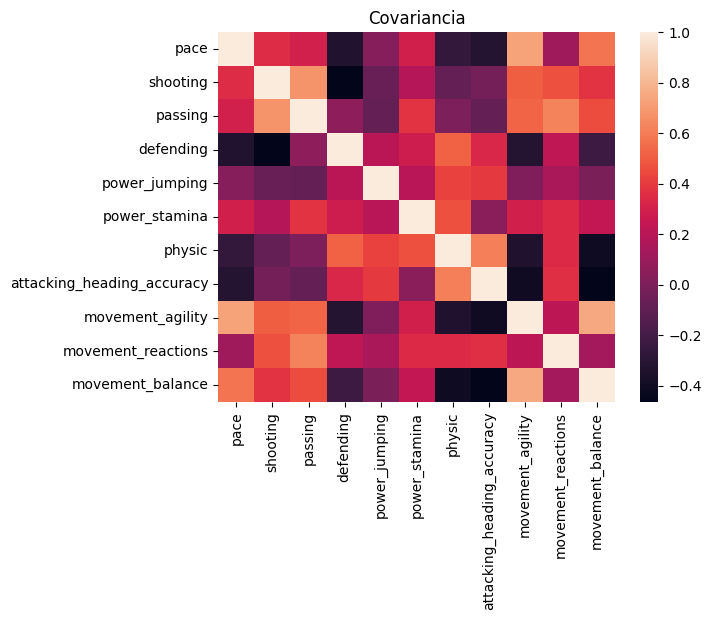

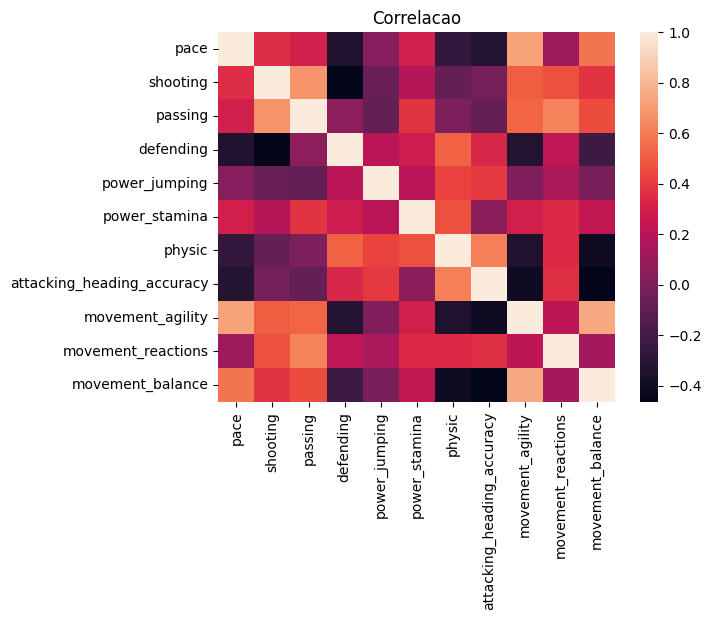

In [702]:
# cria um mapa de cores dos valores da covariancia
sns.heatmap(df_covariance, 
        xticklabels=df_correlation.columns,
        yticklabels=df_correlation.columns)

plt.title('Covariancia')
plt.show()

# cria um mapa de cores dos valores da correlação
sns.heatmap(df_correlation, 
        xticklabels=df_correlation.columns,
        yticklabels=df_correlation.columns)

plt.title('Correlacao')
plt.show()

Por fim, utilizando a biblioteca sklearn, vamos treinar com modelo de Naive Bayes e exibir a Acuarácia na tela

In [679]:
from sklearn.model_selection import train_test_split
X = df_dataset.iloc[:, 1:].values
y = df_dataset.iloc[:, 0].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Criando o modelo Naive Bayes
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()

# Treinando o modelo
model.fit(X_train, y_train)

# Fazendo as previsões
y_pred = model.predict(X_test)

# Avaliando o modelo
from sklearn.metrics import accuracy_score
print("Acurácia: ", accuracy_score(y_test, y_pred))


Acurácia:  0.6079295154185022


---
## Conclusão

Ao avaliar a acurácia do modelo, constatamos que ele atingiu uma acurácia de 0.6079, o que significa que ele foi capaz de classificar corretamente a posição de um jogador em cerca de 60,8% das vezes. Embora isso possa parecer relativamente baixo, é importante lembrar que o desempenho do modelo pode ser influenciado por diversos fatores, como a qualidade e a quantidade dos dados utilizados para treinamento, a escolha das características relevantes, entre outros.

Além disso, é importante destacar que o modelo de Naive Bayes é um algoritmo relativamente simples e rápido, que pode ser facilmente implementado em grandes conjuntos de dados. Isso faz com que seja uma ferramenta útil, especialmente quando consideramos o grande volume de dados disponíveis sobre esses jogadores.

---
## Referências

[1] G. Sacramento. NAIVE BAYES: COMO FUNCIONA ESSE ALGORITMO DE CLASSIFICAÇÃO
: [LINK](https://blog.somostera.com/data-science/naive-bayes).

[2] Bittencourt, Guilherme. NAIVE BAYES: Inteligência Artificial: Ferramentas e Teorias. 3. ed. UFSC, 2006



---